In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
# Path to the zip file in Google Drive
zip_path = '/content/drive/MyDrive/Pothole-Detection.zip'

In [ ]:
import zipfile

# Destination directory to unzip the files
extract_dir = '/content/path/PotholeDetection'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

# List files to verify
for root, dirs, files in os.walk(extract_dir):
    for file in files:
        print(os.path.join(root, file))

/content/path/PotholeDetection/data.yaml
/content/path/PotholeDetection/README.dataset.txt
/content/path/PotholeDetection/README.roboflow.txt
/content/path/PotholeDetection/train/labels/175_png_jpg.rf.e362b0a66e00bfee71bf305ebe2bc1d2.txt
/content/path/PotholeDetection/train/labels/059_png_jpg.rf.3e86310ccd27bdc2b9948ed3c72d9a88.txt
/content/path/PotholeDetection/train/labels/img-663_jpg.rf.165d532ab9f2d6aa2e50953eac5952dd.txt
/content/path/PotholeDetection/train/labels/img-440_jpg.rf.590311fe2cf37c97ff1abea2da9e1468.txt
/content/path/PotholeDetection/train/labels/img-7_jpg.rf.42e5e5b43359e22ac45b1e2f7715a756.txt
/content/path/PotholeDetection/train/labels/img-549_jpg.rf.0ef532b23e981229eafb1e38813b53fc.txt
/content/path/PotholeDetection/train/labels/img-392_jpg.rf.9ff0476f0027197b1926d6a0d6a18406.txt
/content/path/PotholeDetection/train/labels/img-199_jpg.rf.7d5355d2a81de62704c38880cbcd822f.txt
/content/path/PotholeDetection/train/labels/img-67_jpg.rf.e1a6dc64fecffce9bd22628ed50137cb.t

In [ ]:
!pip install ultralytics
!pip install -U ipywidgets
!pip install wandb


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 802.7/802.7 kB 6.3 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import pickle
from tensorflow.keras.utils import to_categorical
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from ultralytics import YOLO
import cv2
from PIL import Image
import torch
from torch import nn
import random

In [ ]:
train_img_dir = '/content/path/PotholeDetection/train/images'
train_images = os.listdir(train_img_dir)

val_img_dir = '/content/path/PotholeDetection/valid/images'
val_images = os.listdir(val_img_dir)

train_labels_dir = '/content/path/PotholeDetection/train/labels'
val_labels_dir = '/content/path/PotholeDetection/valid/labels'

In [ ]:
label_list = ['pothole']

In [ ]:
def label_name(label_class):
    if 0 <= label_class < len(label_list):
        return label_list[label_class]
    else:
        return "none"

def load_labels(images, labels_dir):
    labels = []
    for img in images:
        label_path = os.path.join(labels_dir, img.replace('.jpg', '.txt'))
        try:
            with open(label_path, "r") as file:
                text = file.read().strip()
            if len(text) < 1:
                labels.append('None')
            else:
                labels.append(int(text.split()[0]))
        except FileNotFoundError:
            labels.append('None')
    return labels

train_labels = load_labels(train_images, train_labels_dir)
val_labels = load_labels(val_images, val_labels_dir)

def convert_labels(labels):
    return [int(label) if label != 'None' else -1 for label in labels]

train_labels = convert_labels(train_labels)
val_labels = convert_labels(val_labels)

In [ ]:
df_train = pd.DataFrame({
    'image_path': train_images,
    'label_class': train_labels
})
df_train['label_name'] = df_train['label_class'].apply(label_name)

df_val = pd.DataFrame({
    'image_path': val_images,
    'label_class': val_labels
})
df_val['label_name'] = df_val['label_class'].apply(label_name)


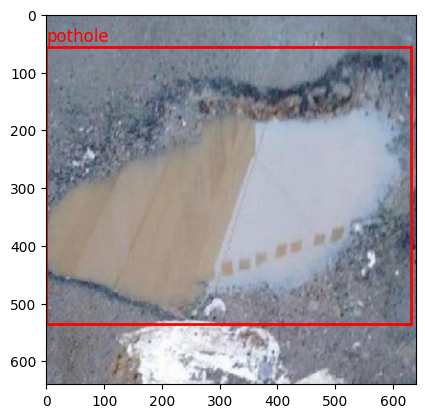

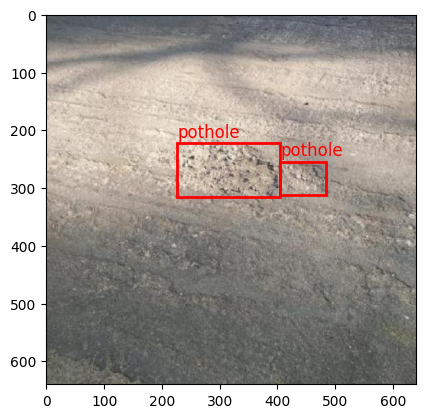

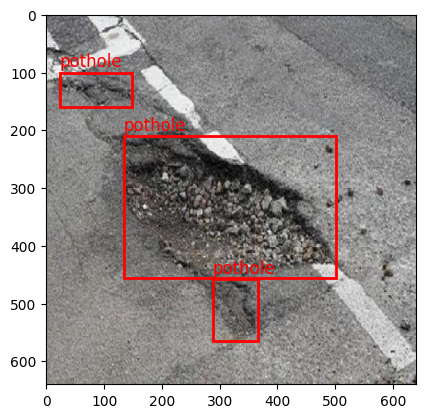

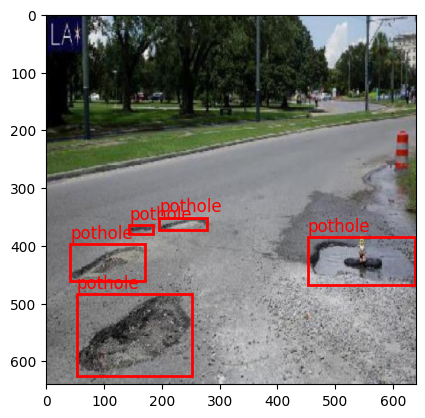

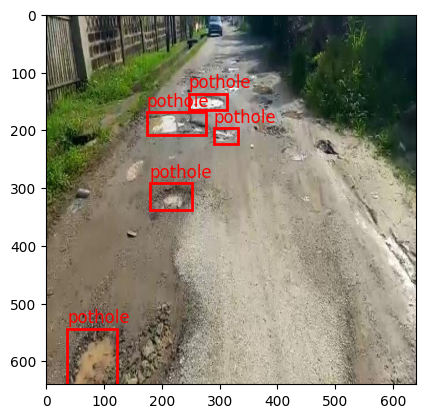

In [ ]:

import matplotlib.patches as patches

def plot_bounding_box(image_path, labels_dir):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    label_path = os.path.join(labels_dir, os.path.basename(image_path).replace('.jpg', '.txt'))
    fig, ax = plt.subplots(1)
    ax.imshow(img)
    try:
        with open(label_path, 'r') as file:
            for line in file:
                class_id, x_center, y_center, width, height = map(float, line.split())
                x_center, y_center, width, height = x_center * img.shape[1], y_center * img.shape[0], width * img.shape[1], height * img.shape[0]
                rect = patches.Rectangle((x_center - width / 2, y_center - height / 2), width, height, linewidth=2, edgecolor='r', facecolor='none')
                ax.add_patch(rect)
                plt.text(x_center - width / 2, y_center - height / 2 - 10, label_name(int(class_id)), color='r', fontsize=12)
    except FileNotFoundError:
        print(f"Label file not found for {image_path}")
    plt.show()


for img_path in df_train['image_path'].sample(5).values:
    plot_bounding_box(os.path.join(train_img_dir, img_path), train_labels_dir)

In [ ]:
import torch
import torch.nn as nn

class SpatialAttention(nn.Module):
    def _init_(self, kernel_size=7):
        super(SpatialAttention, self)._init_()
        self.conv1 = nn.Conv2d(2, 1, kernel_size, padding=(kernel_size - 1) // 2, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        x = torch.cat([avg_out, max_out], dim=1)
        x = self.conv1(x)
        return self.sigmoid(x)

In [ ]:
import torch
import torch.nn as nn
from ultralytics import YOLO

class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttention, self).__init__()
        assert kernel_size in (3, 7), 'kernel size must be 3 or 7'
        padding = 3 if kernel_size == 7 else 1

        self.conv1 = nn.Conv2d(2, 1, kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        x = torch.cat([avg_out, max_out], dim=1)
        x = self.conv1(x)
        return self.sigmoid(x)

class YOLOv9WithAttention(nn.Module):
    def __init__(self, yolo_model):
        super(YOLOv9WithAttention, self).__init__()
        self.backbone = yolo_model.model.model[0]
        self.neck = yolo_model.model.model[1]
        self.head = yolo_model.model.model[2]
        self.spatial_attention = SpatialAttention(kernel_size=7)

    def forward(self, x):
        x = self.backbone(x)
        x = self.spatial_attention(x) * x
        x = self.neck(x)
        x = self.head(x)
        return x

# Load the pre-trained YOLOv9 model
yolo_model = YOLO("yolov9c.pt")

# Integrate the spatial attention module
model_with_attention = YOLOv9WithAttention(yolo_model)
import torch
import torch.nn as nn
from ultralytics import YOLO

class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttention, self).__init__()
        assert kernel_size in (3, 7), 'kernel size must be 3 or 7'
        padding = 3 if kernel_size == 7 else 1

        self.conv1 = nn.Conv2d(2, 1, kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        x = torch.cat([avg_out, max_out], dim=1)
        x = self.conv1(x)
        return self.sigmoid(x)

class YOLOv9WithAttention(nn.Module):
    def __init__(self, yolo_model):
        super(YOLOv9WithAttention, self).__init__()
        self.backbone = yolo_model.model.model[0]
        self.neck = yolo_model.model.model[1]
        self.head = yolo_model.model.model[2]
        self.spatial_attention = SpatialAttention(kernel_size=7)

    def forward(self, x):
        x = self.backbone(x)
        x = self.spatial_attention(x) * x
        x = self.neck(x)
        x = self.head(x)
        return x

# Load the pre-trained YOLOv9 model
yolo_model = YOLO("yolov9c.pt")

# Integrate the spatial attention module
model_with_attention = YOLOv9WithAttention(yolo_model)


100%|██████████| 49.4M/49.4M [00:00<00:00, 100MB/s] 


In [ ]:
model = YOLO("/content/yolov9c.pt")

#wandb.login(key="61a11588a7dfdbf3b5d9121ce4a63f9df789546e")

model.train(data="/content/path/PotholeDetection/data.yaml", epochs=20, imgsz=512, lr0=0.001, dropout=0.2)


Ultralytics YOLOv8.2.57 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/yolov9c.pt, data=/content/path/PotholeDetection/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.2, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True

100%|██████████| 755k/755k [00:00<00:00, 15.2MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    212864  ultralytics.nn.modules.block.RepNCSPELAN4    [128, 256, 128, 64, 1]        
  3                  -1  1    164352  ultralytics.nn.modules.block.ADown           [256, 256]                    
  4                  -1  1    847616  ultralytics.nn.modules.block.RepNCSPELAN4    [256, 512, 256, 128, 1]       
  5                  -1  1    656384  ultralytics.nn.modules.block.ADown           [512, 512]                    
  6                  -1  1   2857472  ultralytics.nn.modules.block.RepNCSPELAN4    [512, 512, 512, 256, 1]       
  7                  -1  1    656384  ultralytics

<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.25M/6.25M [00:00<00:00, 77.1MB/s]
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


AMP: checks passed ✅


train: Scanning /content/path/PotholeDetection/train/labels... 943 images, 0 backgrounds, 0 corrupt: 100%|██████████| 943/943 [00:01<00:00, 561.04it/s]

train: New cache created: /content/path/PotholeDetection/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/path/PotholeDetection/valid/labels... 269 images, 0 backgrounds, 0 corrupt: 100%|██████████| 269/269 [00:00<00:00, 470.40it/s]

val: New cache created: /content/path/PotholeDetection/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 154 weight(decay=0.0), 161 weight(decay=0.0005), 160 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      7.65G      1.751      2.151      1.603         70        512: 100%|██████████| 59/59 [00:37<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.36it/s]

                   all        269        988    0.00577      0.424    0.00407    0.00168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      7.51G      1.796      1.627      1.639         67        512: 100%|██████████| 59/59 [00:31<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.66it/s]

                   all        269        988     0.0273      0.577     0.0217    0.00925



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      7.48G      1.773      1.604      1.586         96        512: 100%|██████████| 59/59 [00:32<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.00it/s]

                   all        269        988      0.266        0.2      0.136     0.0531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20       7.5G      1.677      1.467      1.544        116        512: 100%|██████████| 59/59 [00:32<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.95it/s]

                   all        269        988      0.652      0.493      0.548      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      7.47G      1.673      1.439      1.551        108        512: 100%|██████████| 59/59 [00:33<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.16it/s]

                   all        269        988      0.621      0.541      0.573      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      7.46G      1.609      1.372      1.486         85        512: 100%|██████████| 59/59 [00:33<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.20it/s]

                   all        269        988       0.66      0.594      0.631      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      7.43G      1.564      1.309      1.461         79        512: 100%|██████████| 59/59 [00:33<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.21it/s]

                   all        269        988      0.664      0.539      0.608      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      7.45G      1.538      1.244       1.45         60        512: 100%|██████████| 59/59 [00:32<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.21it/s]

                   all        269        988      0.712      0.683       0.74      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      7.43G      1.516      1.183      1.428        123        512: 100%|██████████| 59/59 [00:33<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.20it/s]

                   all        269        988      0.685      0.614      0.693      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      7.42G      1.513      1.164      1.419         51        512: 100%|██████████| 59/59 [00:32<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.95it/s]

                   all        269        988      0.772      0.734       0.81      0.462


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      7.43G      1.464      1.102      1.407         60        512: 100%|██████████| 59/59 [00:34<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.15it/s]

                   all        269        988      0.764      0.806       0.84      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      7.47G      1.437      1.053      1.407         33        512: 100%|██████████| 59/59 [00:32<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.93it/s]

                   all        269        988      0.768      0.717        0.8      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      7.46G      1.409      1.022      1.377         89        512: 100%|██████████| 59/59 [00:31<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.75it/s]

                   all        269        988      0.811      0.733      0.829      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      7.44G      1.383     0.9883      1.367         59        512: 100%|██████████| 59/59 [00:31<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.65it/s]

                   all        269        988       0.81      0.769      0.832      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      7.46G      1.347     0.9456      1.338         55        512: 100%|██████████| 59/59 [00:31<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.63it/s]

                   all        269        988      0.785      0.793      0.849      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      7.44G      1.321     0.8851      1.322         62        512: 100%|██████████| 59/59 [00:31<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.68it/s]

                   all        269        988      0.813      0.783      0.858       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      7.43G      1.314     0.8536      1.316         48        512: 100%|██████████| 59/59 [00:32<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.86it/s]

                   all        269        988        0.8      0.798      0.858      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      7.44G      1.282     0.8206       1.29         46        512: 100%|██████████| 59/59 [00:31<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.61it/s]

                   all        269        988      0.803      0.815      0.874      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      7.43G      1.248     0.7957      1.282         43        512: 100%|██████████| 59/59 [00:31<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.86it/s]

                   all        269        988      0.837      0.815       0.88      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      7.42G       1.23     0.7617      1.265         55        512: 100%|██████████| 59/59 [00:32<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.89it/s]

                   all        269        988      0.857      0.805       0.89      0.553



20 epochs completed in 0.229 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 51.6MB
Optimizer stripped from runs/detect/train/weights/best.pt, 51.6MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.57 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25,320,019 parameters, 0 gradients, 102.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:09<00:00,  1.03s/it]


                   all        269        988      0.856      0.805      0.889      0.552
Speed: 0.2ms preprocess, 11.9ms inference, 0.0ms loss, 6.0ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▃▆██▇▇▆▆▆▅▅▄▄▃▃▃▂▂▁▁
lr/pg1,▃▆██▇▇▆▆▆▅▅▄▄▃▃▃▂▂▁▁
lr/pg2,▃▆██▇▇▆▆▆▅▅▄▄▃▃▃▂▂▁▁
metrics/mAP50(B),▁▁▂▅▅▆▆▇▆▇█▇████████
metrics/mAP50-95(B),▁▁▂▄▄▅▅▆▆▇▇▇▇▇▇█████
metrics/precision(B),▁▁▃▆▆▆▆▇▇▇▇▇██▇█████
metrics/recall(B),▄▅▁▄▅▅▅▇▆▇█▇▇▇██████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,▇██▇▆▆▅▅▅▅▄▄▃▃▂▂▂▂▁▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78b12d829240>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [ ]:
trained_weights = "/content/runs/detect/train/weights/best.pt"
model = YOLO(trained_weights)

# Evaluate the model on the validation set
results = model.val(data = '/content/path/PotholeDetection/data.yaml')

# Print the evaluation metrics
# Accessing metrics using the appropriate methods
precision = results.box.mp # Mean precision
recall = results.box.mr    # Mean recall
mAP50 = results.box.map50  # mAP@0.5
mAP50_95 = results.box.map  # mAP@0.5:0.95

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"mAP@0.5: {mAP50}")
print(f"mAP@0.5:0.95: {mAP50_95}")


Ultralytics YOLOv8.2.57 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25,320,019 parameters, 0 gradients, 102.3 GFLOPs


val: Scanning /content/path/PotholeDetection/valid/labels.cache... 269 images, 0 backgrounds, 0 corrupt: 100%|██████████| 269/269 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:14<00:00,  1.14it/s]


                   all        269        988       0.86      0.804       0.89      0.552
Speed: 0.5ms preprocess, 27.0ms inference, 0.0ms loss, 4.8ms postprocess per image
Results saved to runs/detect/val
Precision: 0.8602540244168622
Recall: 0.8037485895236616
mAP@0.5: 0.8899101357684223
mAP@0.5:0.95: 0.5523345060572618


In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import pickle
from tensorflow.keras.utils import to_categorical
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from ultralytics import YOLO
import cv2
from PIL import Image
import torch
from torch import nn
import random

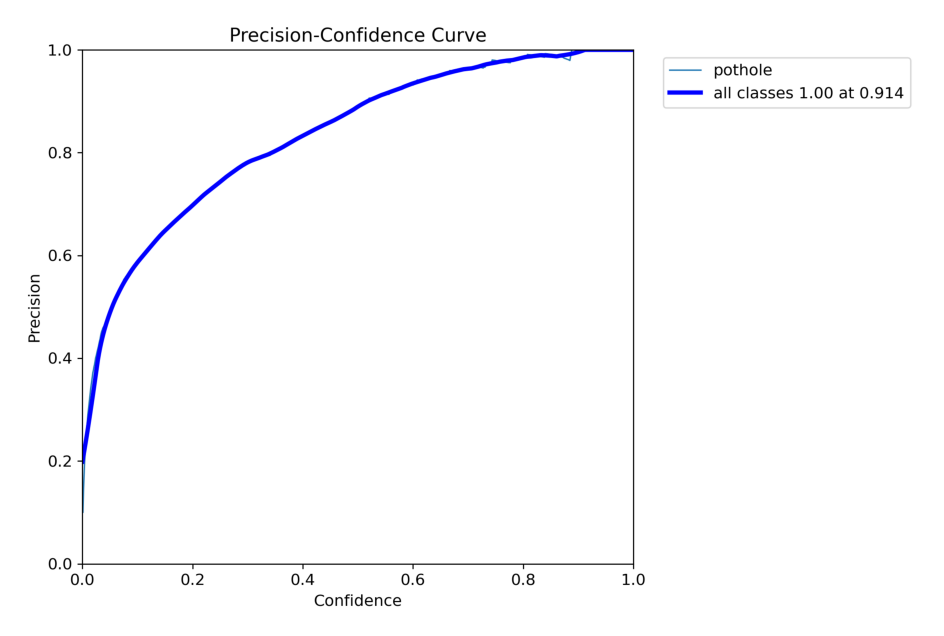

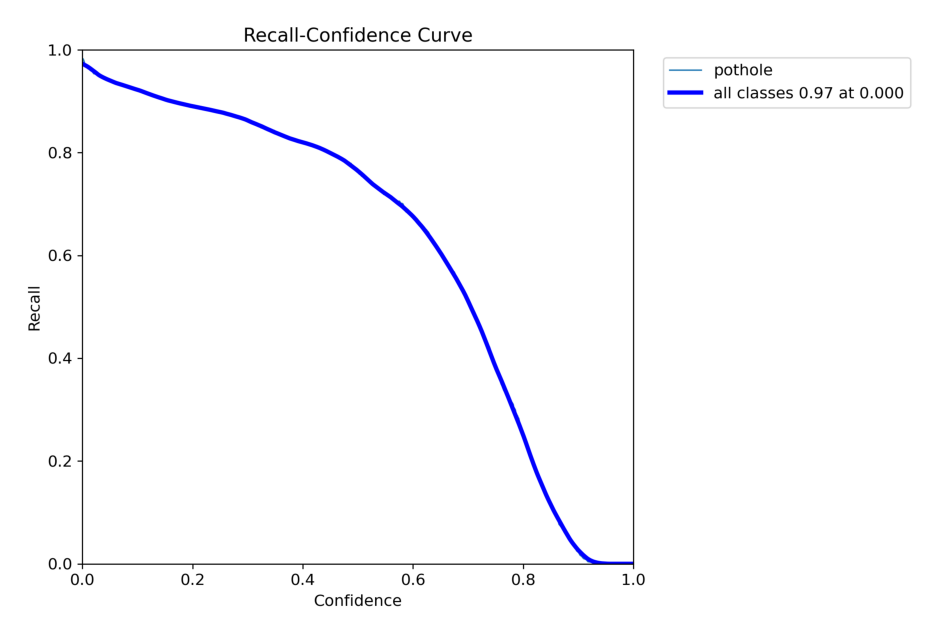

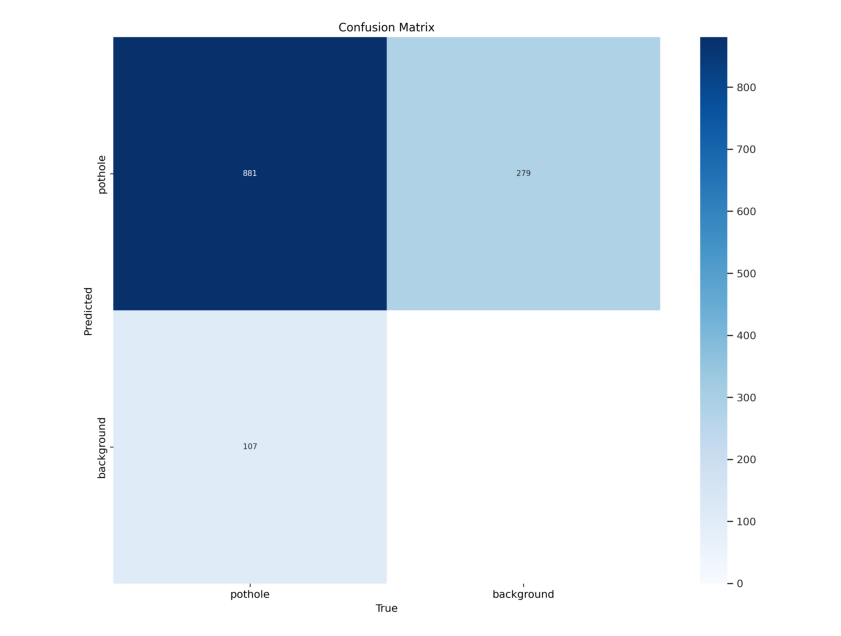

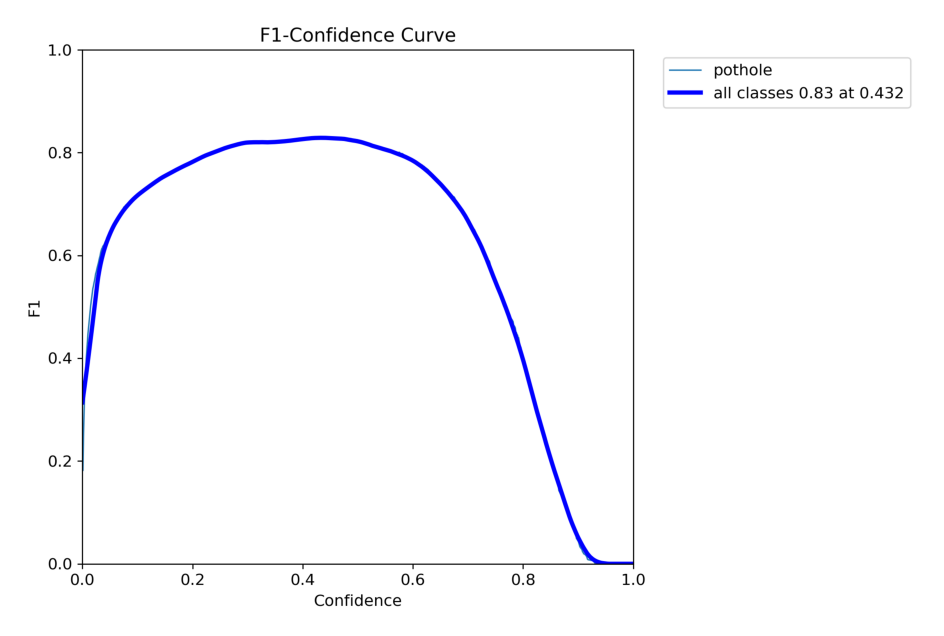

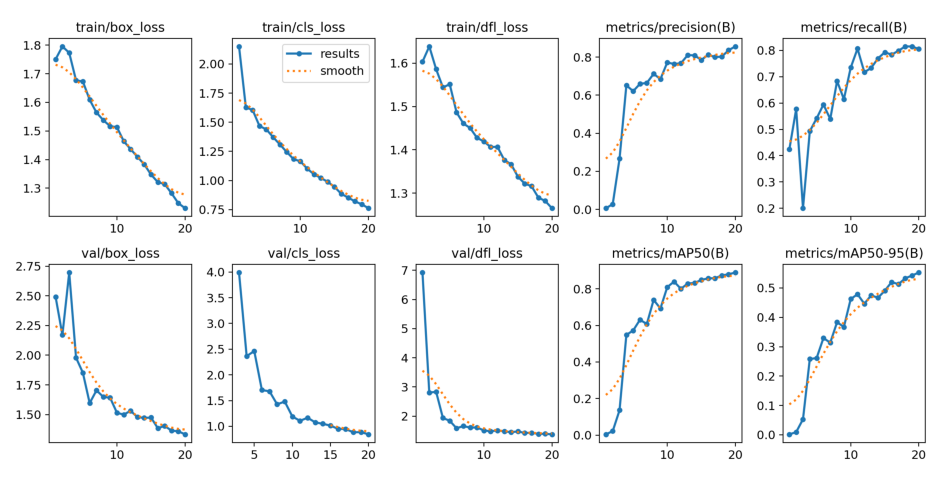

In [ ]:
list_of_metrics = ["P_curve.png", "R_curve.png", "confusion_matrix.png", "F1_curve.png", "results.png"]

for metric in list_of_metrics:
    image = Image.open(f'/content/runs/detect/train/{metric}')
    plt.figure(figsize=(12, 8))
    plt.axis("off")
    plt.imshow(image)
    plt.show()


In [ ]:
trained_weights = "/content/best.pt"
model = YOLO(trained_weights)

In [ ]:
def test_visualization(images):
    output = model.predict(images)
    fig, axes = plt.subplots(3, 3, figsize=(11, 11))
    for i, r in enumerate(images):
        ax = axes[i // 3, i % 3]
        im_bgr = cv2.imread(r)
        im_rgb = Image.fromarray(im_bgr[..., ::-1])  # RGB-order PIL image
        ax.axis('off')
        ax.set_title(f"Image {i}")
        ax.imshow(im_rgb)
    fig, axes = plt.subplots(3, 3, figsize=(11, 11))
    for i, r in enumerate(output):
        ax = axes[i // 3, i % 3]
        im_bgr = r.plot()  # BGR-order numpy array
        im_rgb = Image.fromarray(im_bgr[..., ::-1])  # RGB-order PIL image
        ax.axis('off')
        ax.set_title(f"Image {i}")
        ax.imshow(im_rgb)



0: 512x512 8 potholes, 25.8ms
1: 512x512 2 potholes, 25.8ms
2: 512x512 1 pothole, 25.8ms
3: 512x512 8 potholes, 25.8ms
4: 512x512 3 potholes, 25.8ms
5: 512x512 12 potholes, 25.8ms
6: 512x512 1 pothole, 25.8ms
7: 512x512 2 potholes, 25.8ms
8: 512x512 3 potholes, 25.8ms
Speed: 2.6ms preprocess, 25.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 512)


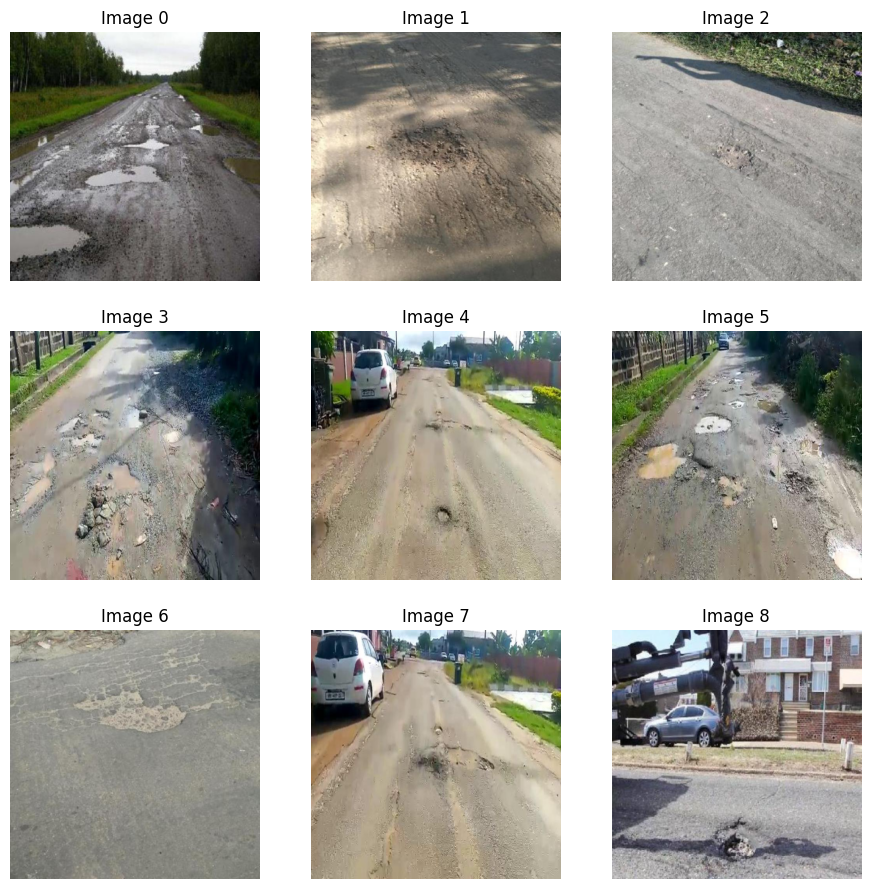

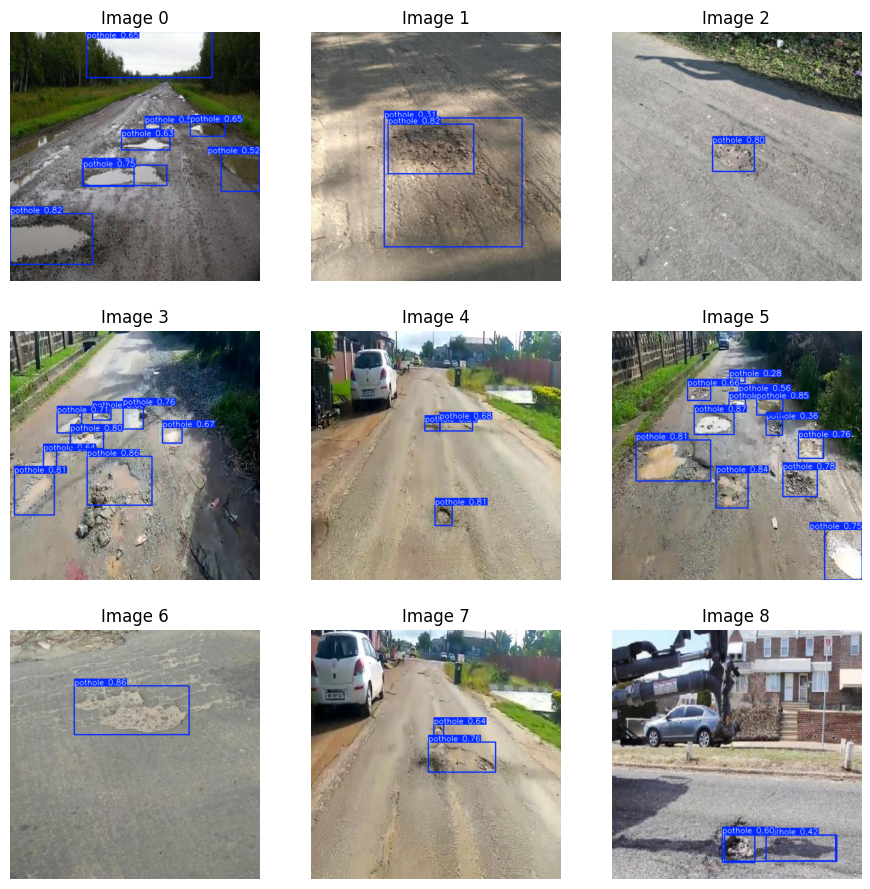

In [ ]:
test_img_dir = '/content/path/PotholeDetection/test/images'
test_images = os.listdir(test_img_dir)
test_img = [os.path.join(test_img_dir, img) for img in test_images[:9]]

test_visualization(test_img)

In [ ]:
import os
import random
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob`
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')

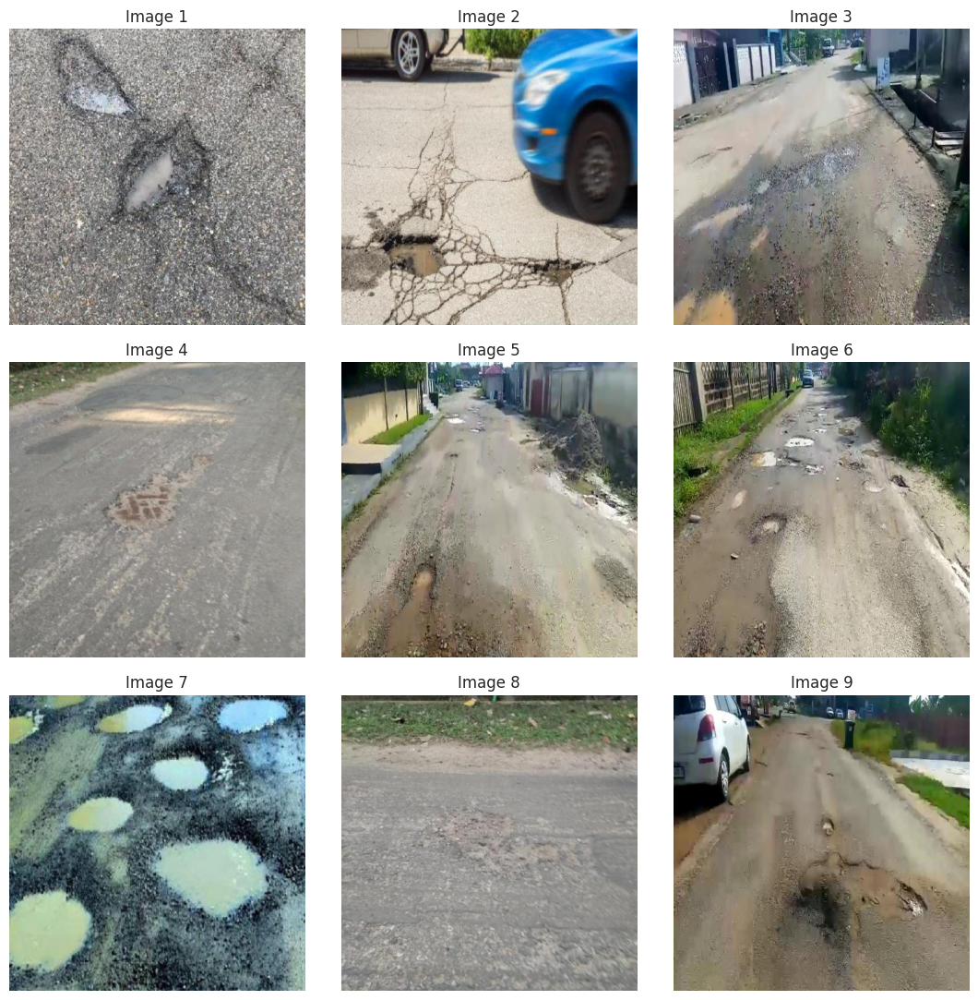

In [ ]:
Image_dir = '/content/path/PotholeDetection/train/images'

num_samples = 9
image_files = os.listdir(Image_dir)

# Randomly select num_samples images
rand_images = random.sample(image_files, num_samples)

fig, axes = plt.subplots(3, 3, figsize=(11, 11))

for i in range(num_samples):
    image = rand_images[i]
    ax = axes[i // 3, i % 3]
    ax.imshow(plt.imread(os.path.join(Image_dir, image)))
    ax.set_title(f'Image {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# Get the size of the image
image = cv2.imread("/content/path/PotholeDetection/train/images/001_png_jpg.rf.2880879f2df50a5b6aabf46c1137c5ec.jpg")
h, w, c = image.shape
print(f"The image has dimensions {w}x{h} and {c} channels.")

The image has dimensions 640x640 and 3 channels.



image 1/1 /content/path/PotholeDetection/train/images/001_png_jpg.rf.2880879f2df50a5b6aabf46c1137c5ec.jpg: 416x416 1 car, 6.7ms
Speed: 1.5ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /content/path/PotholeDetection/train/images/001_png_jpg.rf.2880879f2df50a5b6aabf46c1137c5ec.jpg: 416x416 1 car, 6.6ms
Speed: 1.4ms preprocess, 6.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


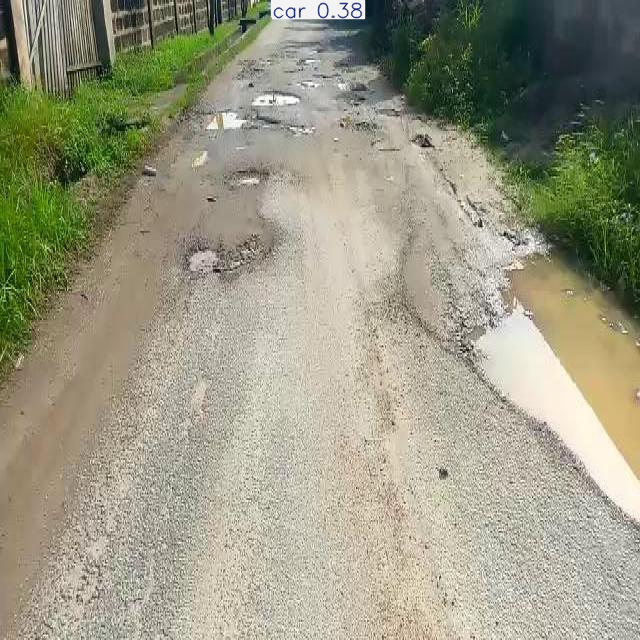

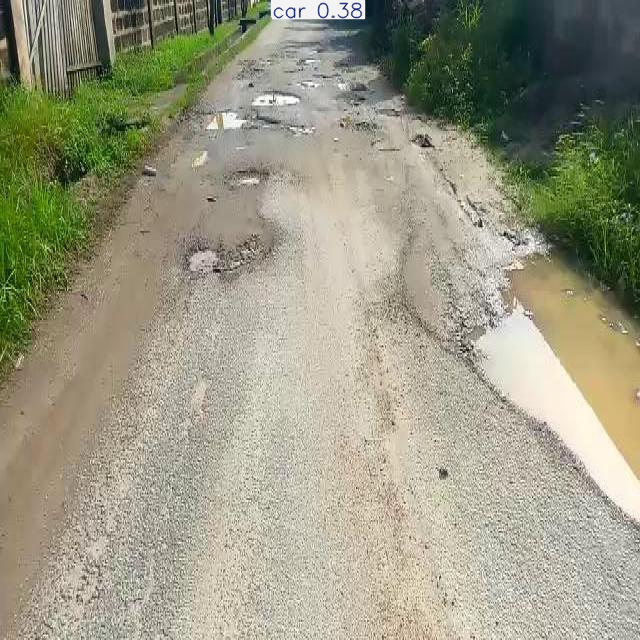

In [ ]:

#model = YOLO("yolov8n.pt")

# Use the model to detect object
model = YOLO("yolov8n.pt")

# Use the model to detect object
image = "/content/path/PotholeDetection/train/images/001_png_jpg.rf.2880879f2df50a5b6aabf46c1137c5ec.jpg"
result_predict = model.predict(source = image, imgsz=(416))

# show results
result_predict = model.predict(source = image, imgsz=(416))
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))
# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

In [ ]:
Final_model = YOLO('yolov8n.yaml').load('yolov8n.pt')

# Training The Final Model
Result_Final_model = Final_model.train(data="/content/path/PotholeDetection/data.yaml",epochs=20, imgsz = 416, batch = 64 ,lr0=0.0001, dropout= 0.15, device = 0)

Transferred 355/355 items from pretrained weights
Ultralytics YOLOv8.2.57 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/content/path/PotholeDetection/data.yaml, epochs=20, time=None, patience=100, batch=64, imgsz=416, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.15, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_con

wandb: Currently logged in as: 2203a52005 (2203a52005-sr-university). Use `wandb login --relogin` to force relogin


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...
AMP: checks passed ✅


train: Scanning /content/path/PotholeDetection/train/labels.cache... 943 images, 0 backgrounds, 0 corrupt: 100%|██████████| 943/943 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/path/PotholeDetection/valid/labels.cache... 269 images, 0 backgrounds, 0 corrupt: 100%|██████████| 269/269 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 416 train, 416 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      3.95G      1.818      3.102      1.478        208        416: 100%|██████████| 15/15 [00:13<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.80s/it]

                   all        269        988      0.011      0.895      0.151     0.0759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      3.84G      1.585      1.653      1.243        314        416: 100%|██████████| 15/15 [00:10<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.02it/s]


                   all        269        988       0.88     0.0296      0.135     0.0688

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      3.84G      1.519      1.432      1.218        302        416: 100%|██████████| 15/15 [00:14<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.82s/it]


                   all        269        988      0.857     0.0516      0.241      0.123

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      3.85G      1.522      1.362      1.215        283        416: 100%|██████████| 15/15 [00:07<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.31s/it]

                   all        269        988      0.276      0.296      0.198     0.0917



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      3.87G      1.524       1.31       1.22        279        416: 100%|██████████| 15/15 [00:12<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.12s/it]

                   all        269        988      0.512      0.376      0.383      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      3.85G      1.485       1.26      1.207        238        416: 100%|██████████| 15/15 [00:11<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.58s/it]


                   all        269        988       0.58      0.493      0.517      0.271

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      3.84G      1.513      1.272      1.221        278        416: 100%|██████████| 15/15 [00:08<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.48s/it]


                   all        269        988      0.384      0.448      0.364      0.191

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      3.78G      1.509      1.246      1.225        292        416: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.13it/s]


                   all        269        988       0.49      0.546      0.493      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      3.83G      1.481      1.177      1.207        285        416: 100%|██████████| 15/15 [00:10<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.75s/it]

                   all        269        988      0.538      0.627      0.594      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      3.82G      1.445      1.116      1.176        232        416: 100%|██████████| 15/15 [00:08<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.20it/s]


                   all        269        988      0.637       0.65      0.682      0.374
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      3.79G      1.416      1.073      1.166        194        416: 100%|██████████| 15/15 [00:17<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.12it/s]


                   all        269        988      0.709      0.698      0.746      0.414

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      3.79G      1.369     0.9998      1.143        138        416: 100%|██████████| 15/15 [00:12<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.04it/s]

                   all        269        988      0.766      0.722      0.813      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      3.79G      1.349     0.9554      1.132        186        416: 100%|██████████| 15/15 [00:08<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.60s/it]

                   all        269        988      0.755      0.767      0.805      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      3.81G      1.329     0.9271      1.111        181        416: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.03it/s]

                   all        269        988      0.819      0.752      0.845      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      3.79G      1.289     0.8818      1.097        168        416: 100%|██████████| 15/15 [00:12<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.38s/it]

                   all        269        988      0.818      0.789      0.862      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      3.81G      1.281      0.857      1.092        177        416: 100%|██████████| 15/15 [00:07<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.29s/it]

                   all        269        988      0.863      0.775      0.873      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      3.82G      1.253       0.83       1.08        135        416: 100%|██████████| 15/15 [00:12<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.20it/s]

                   all        269        988      0.866      0.781       0.88      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      3.79G      1.232     0.7999      1.058        132        416: 100%|██████████| 15/15 [00:09<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.58s/it]

                   all        269        988      0.845      0.816      0.894      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      3.81G      1.218     0.7786       1.06        160        416: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.25it/s]


                   all        269        988      0.891      0.787      0.895      0.554

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      3.83G       1.18     0.7383      1.047        181        416: 100%|██████████| 15/15 [00:12<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.43s/it]

                   all        269        988      0.855      0.815      0.897      0.567



20 epochs completed in 0.096 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.2MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics YOLOv8.2.57 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.20s/it]


                   all        269        988       0.85      0.817      0.897      0.566
Speed: 0.1ms preprocess, 1.1ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to runs/detect/train2


lr/pg0,▂▃▅▆▇██▇▇▆▆▅▅▄▄▃▃▂▂▁
lr/pg1,▂▃▅▆▇██▇▇▆▆▅▅▄▄▃▃▂▂▁
lr/pg2,▂▃▅▆▇██▇▇▆▆▅▅▄▄▃▃▂▂▁
metrics/mAP50(B),▁▁▂▂▃▅▃▄▅▆▇▇▇███████
metrics/mAP50-95(B),▁▁▂▁▃▄▃▃▅▅▆▆▇▇▇▇▇███
metrics/precision(B),▁██▃▅▆▄▅▅▆▇▇▇▇▇█████
metrics/recall(B),█▁▁▃▄▅▄▅▆▆▆▇▇▇▇▇▇▇▇▇
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▅▅▅▅▄▅▅▄▄▄▃▃▃▂▂▂▂▁▁


In [ ]:
list_of_metrics = ["P_curve.png","R_curve.png","confusion_matrix.png"]

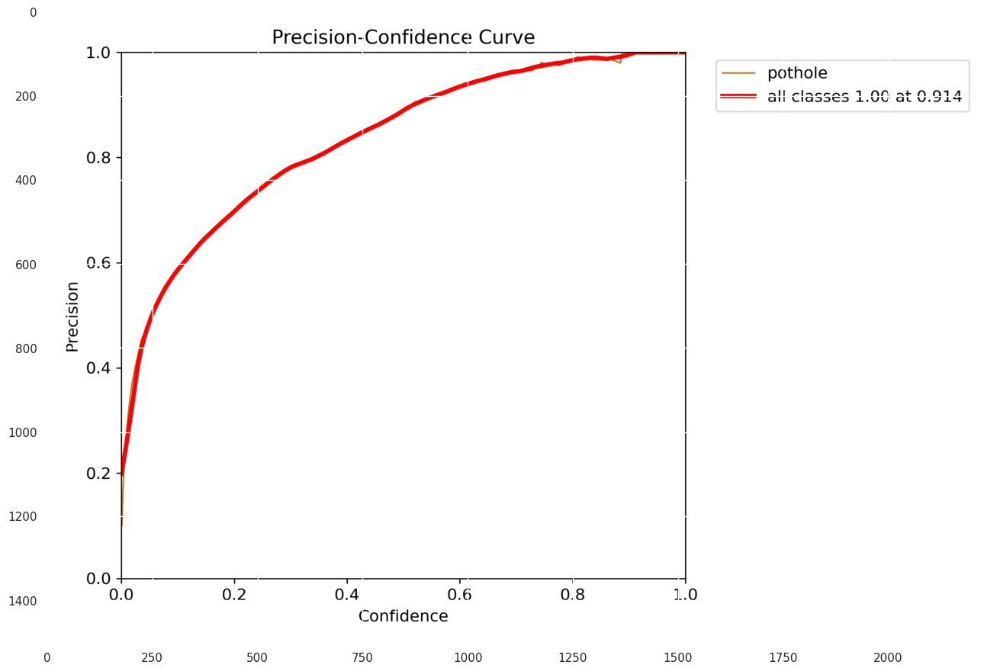

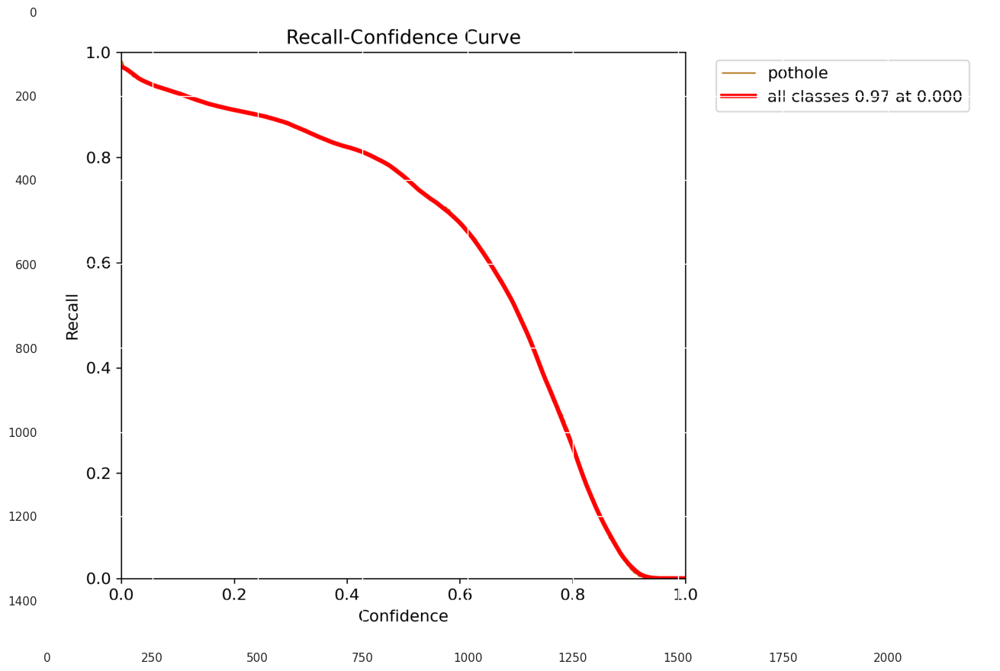

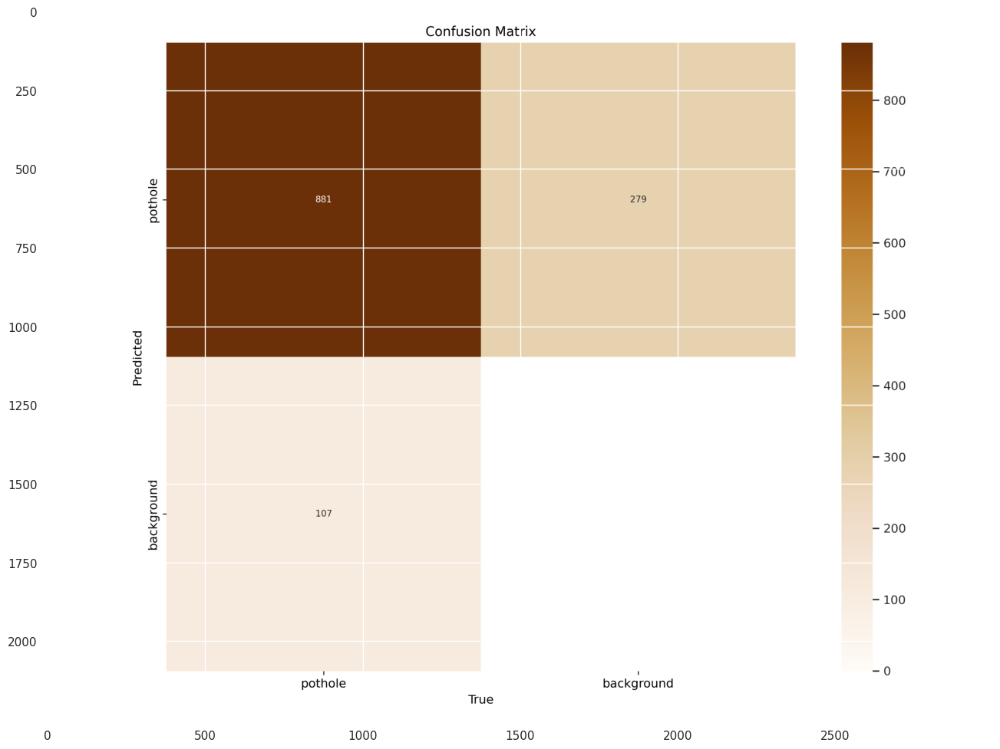

In [ ]:
for i in list_of_metrics:
    image = cv2.imread(f'/content/runs/detect/train/{i}')

    # Create a larger figure
    plt.figure(figsize=(16, 12))

    # Display the image
    plt.imshow(image)

    # Show the plot
    plt.show()

In [ ]:
Result_Final_model = pd.read_csv('/content/runs/detect/train/results.csv')
Result_Final_model.tail(10)

,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
10,11,1.4640,1.10160,1.4066,0.76406,0.80631,0.83969,0.47846,1.4994,1.1063,1.4816,0.001010,0.001010,0.001010
11,12,1.4365,1.05260,1.4069,0.76794,0.71677,0.80039,0.44635,1.5318,1.1668,1.5103,0.000911,0.000911,0.000911
12,13,1.4095,1.02210,1.3767,0.81079,0.73298,0.82922,0.47491,1.4783,1.0764,1.4786,0.000812,0.000812,0.000812
13,14,1.3834,0.98825,1.3667,0.80971,0.76923,0.83243,0.46654,1.4715,1.0487,1.4509,0.000713,0.000713,0.000713
14,15,1.3474,0.94562,1.3381,0.78515,0.79251,0.84888,0.49072,1.4748,1.0134,1.4770,0.000614,0.000614,0.000614
15,16,1.3210,0.88506,1.3220,0.81304,0.78346,0.85789,0.51990,1.3847,0.95015,1.4244,0.000515,0.000515,0.000515
16,17,1.3143,0.85356,1.3162,0.80014,0.79825,0.85816,0.51290,1.4047,0.94752,1.4305,0.000416,0.000416,0.000416
17,18,1.2823,0.82059,1.2899,0.80290,0.81478,0.87353,0.53278,1.3645,0.88306,1.3902,0.000317,0.000317,0.000317
18,19,1.2475,0.79566,1.2821,0.83677,0.81462,0.87989,0.54229,1.3589,0.88735,1.3964,0.000218,0.000218,0.000218
19,20,1.2297,0.76172,1.2653,0.85658,0.80466,0.88956,0.55254,1.3332,0.84375,1.3769,0.000119,0.000119,0.000119


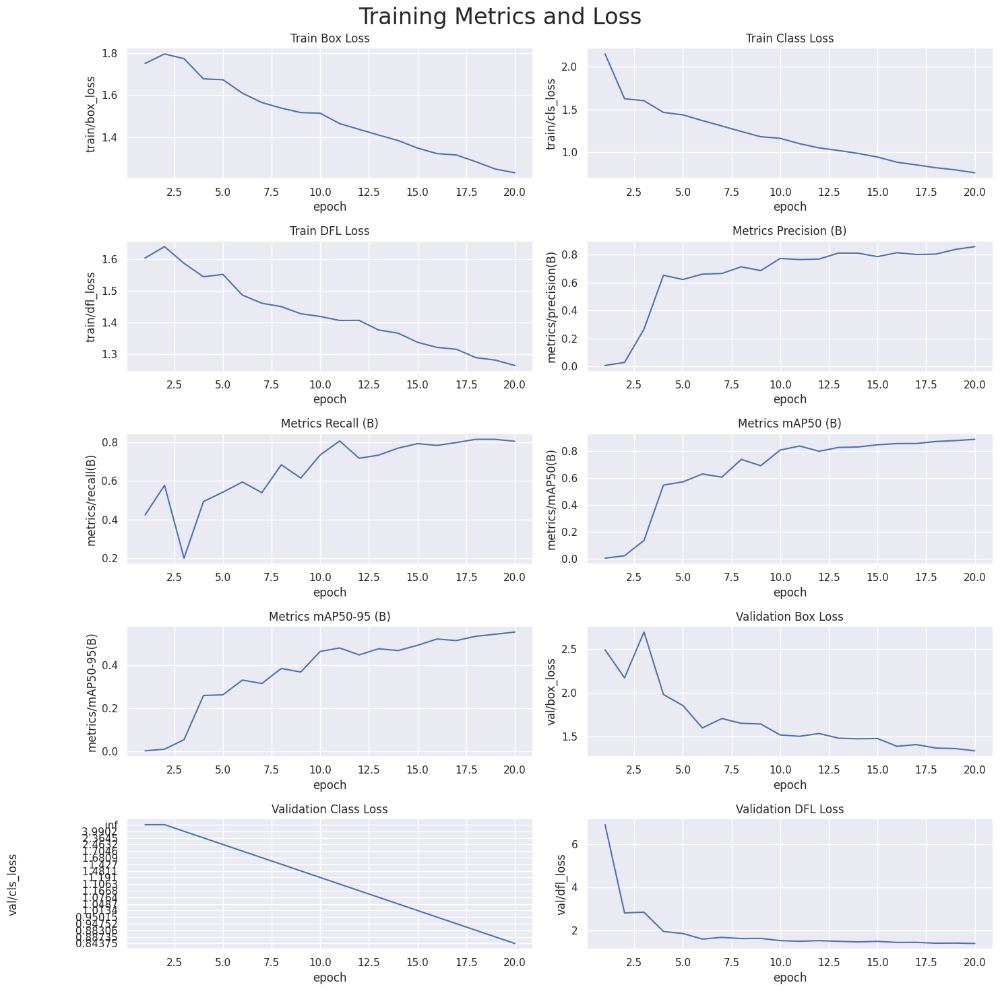

In [ ]:
Result_Final_model.columns = Result_Final_model.columns.str.strip()

# Create subplots
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=Result_Final_model, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=Result_Final_model, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=Result_Final_model, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=Result_Final_model, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=Result_Final_model, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=Result_Final_model, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=Result_Final_model, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=Result_Final_model, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=Result_Final_model, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=Result_Final_model, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

In [ ]:
Valid_model = YOLO('/content/runs/detect/train/weights/best.pt')

# Evaluating the model on the testset
metrics = Valid_model.val(split = 'test')

Ultralytics YOLOv8.2.57 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25,320,019 parameters, 0 gradients, 102.3 GFLOPs


val: Scanning /content/path/PotholeDetection/test/labels... 126 images, 0 backgrounds, 0 corrupt: 100%|██████████| 126/126 [00:00<00:00, 547.76it/s]

val: New cache created: /content/path/PotholeDetection/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:06<00:00,  1.27it/s]


                   all        126        511      0.899      0.838      0.917      0.586
Speed: 0.8ms preprocess, 22.9ms inference, 0.0ms loss, 3.5ms postprocess per image
Results saved to runs/detect/val2


In [ ]:
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

precision(B):  0.8991884551920196
metrics/recall(B):  0.8378399024893364
metrics/mAP50(B):  0.9168964804339481
metrics/mAP50-95(B):  0.5862708353478767


In [ ]:
image_dir = '/content/path/PotholeDetection/test/images'

# Get a list of all image files in the directory
image_files = [os.path.join(image_dir, file) for file in os.listdir(image_dir) if file.endswith('.jpg')]

# Randomly select 10 images from the directory
random_images = random.sample(image_files, k=10)

for image_path in random_images:
    image = cv2.imread(image_path)  # Replace with your preferred method of reading the image
    results = Final_model.predict([image], save=True, imgsz=416, conf=0.5, iou=0.7)
    #results.append(result)


0: 416x416 5 potholes, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 416)
Results saved to runs/detect/train22

0: 416x416 2 potholes, 7.2ms
Speed: 2.6ms preprocess, 7.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)
Results saved to runs/detect/train23

0: 416x416 4 potholes, 7.1ms
Speed: 3.1ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)
Results saved to runs/detect/train24

0: 416x416 2 potholes, 7.2ms
Speed: 3.2ms preprocess, 7.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)
Results saved to runs/detect/train25

0: 416x416 2 potholes, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)
Results saved to runs/detect/train26

0: 416x416 9 potholes, 7.2ms
Speed: 2.6ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 416)
Results saved to runs/detect/train27

0: 416x416 1 pothole,

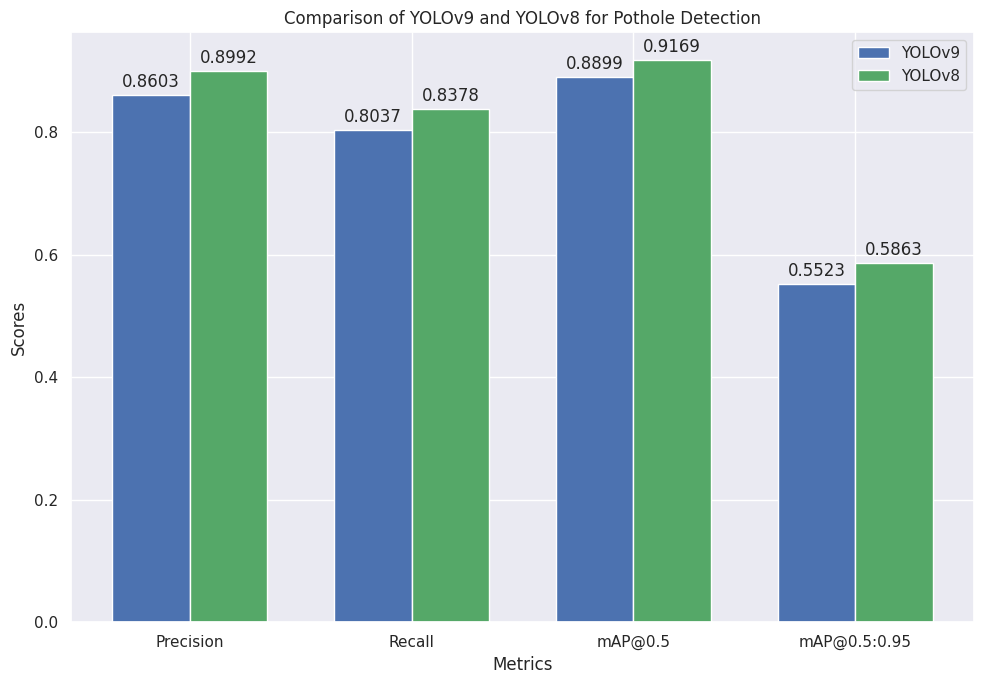

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Results for YOLOv9 and YOLOv8
metrics = ['Precision', 'Recall', 'mAP@0.5', 'mAP@0.5:0.95']
yolov9_results = [0.8602540244168622, 0.8037485895236616, 0.8899101357684223, 0.5523345060572618]
yolov8_results = [0.8991884551920196, 0.8378399024893364, 0.9168964804339481, 0.5862708353478767]

# Number of metrics
num_metrics = len(metrics)
index = np.arange(num_metrics)
bar_width = 0.35

# Plotting the bars
fig, ax = plt.subplots(figsize=(10, 7))
bars1 = ax.bar(index, yolov9_results, bar_width, label='YOLOv9', color='b')
bars2 = ax.bar(index + bar_width, yolov8_results, bar_width, label='YOLOv8', color='g')

# Adding labels, title, and custom x-axis tick labels
ax.set_xlabel('Metrics')
ax.set_ylabel('Scores')
ax.set_title('Comparison of YOLOv9 and YOLOv8 for Pothole Detection')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(metrics)
ax.legend()

# Function to attach labels
def autolabel(bars):
    """Attach a text label above each bar in a bar graph."""
    for bar in bars:
        height = bar.get_height()
        ax.annotate('{:.4f}'.format(height),
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

# Attach labels for each bar
autolabel(bars1)
autolabel(bars2)

# Display the plot
plt.tight_layout()
plt.show()



image 1/1 /content/20240715154653.jpg: 384x512 2 potholes, 1266.9ms
Speed: 16.2ms preprocess, 1266.9ms inference, 25.2ms postprocess per image at shape (1, 3, 384, 512)


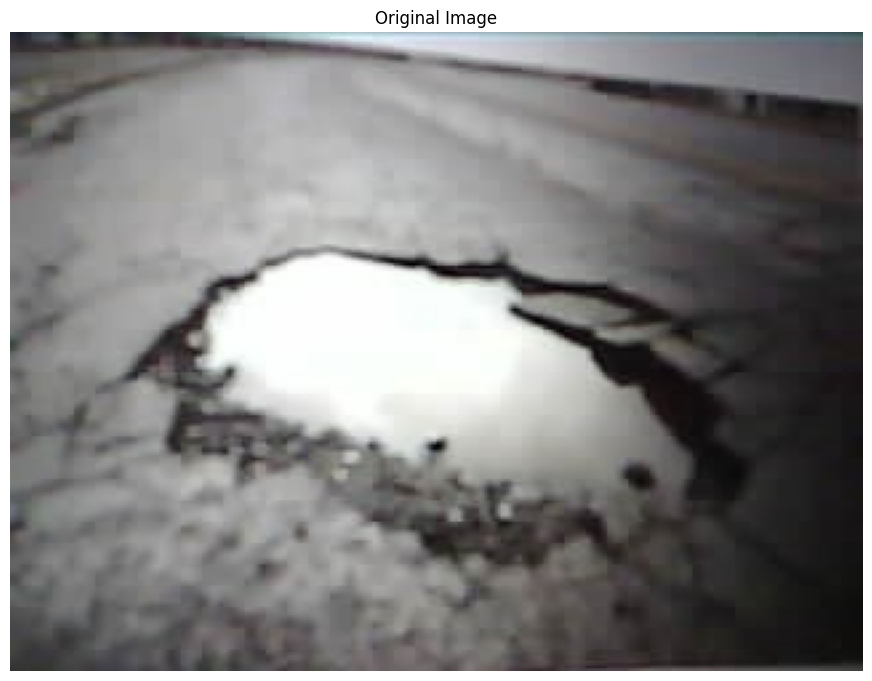

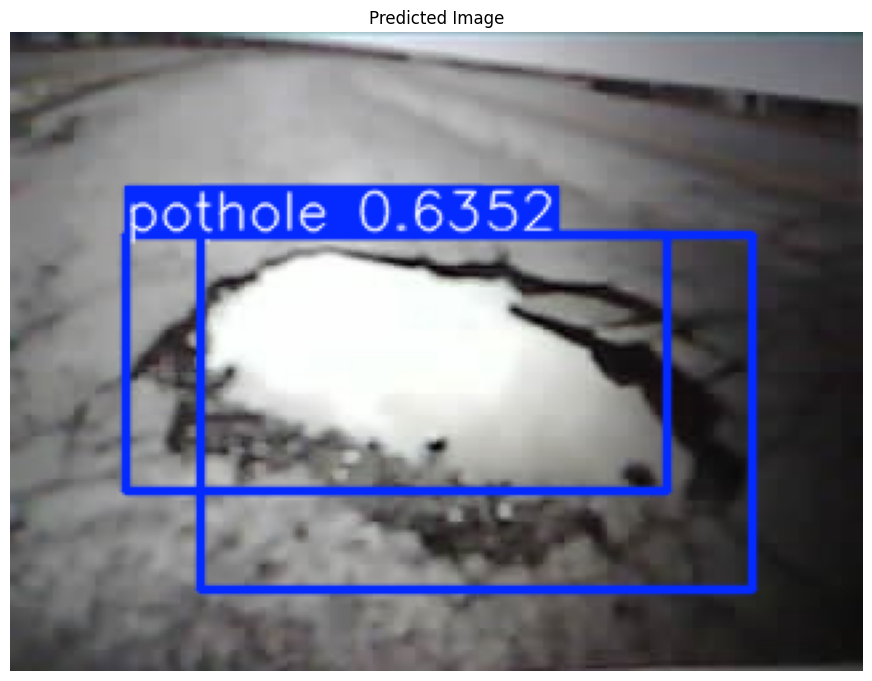

In [ ]:
import cv2
import matplotlib.pyplot as plt
from PIL import Image

# Path to the trained weights
trained_weights = "/content/best.pt"

# Load the YOLO model
model = YOLO(trained_weights)

def test_visualization(image_path):
    output = model.predict(image_path)

    # Load the original image
    im_bgr = cv2.imread(image_path)
    im_rgb = im_bgr[..., ::-1]  # Convert BGR to RGB

    # Plot the original image
    fig, ax = plt.subplots(figsize=(11, 11))
    ax.axis('off')
    ax.set_title("Original Image")
    ax.imshow(im_rgb)
    plt.show()

    # Plot the prediction result
    fig, ax = plt.subplots(figsize=(11, 11))
    ax.axis('off')
    ax.set_title("Predicted Image")
    im_bgr_pred = output[0].plot()  # BGR-order numpy array
    im_rgb_pred = im_bgr_pred[..., ::-1]  # Convert BGR to RGB
    ax.imshow(im_rgb_pred)
    plt.show()

# Path to the image on which you want to make predictions
image_path = "/content/20240715154653.jpg"

# Visualize the prediction on the single image
test_visualization(image_path)



image 1/1 /content/20240715154844.jpg: 384x512 3 potholes, 1446.5ms
Speed: 8.4ms preprocess, 1446.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 512)


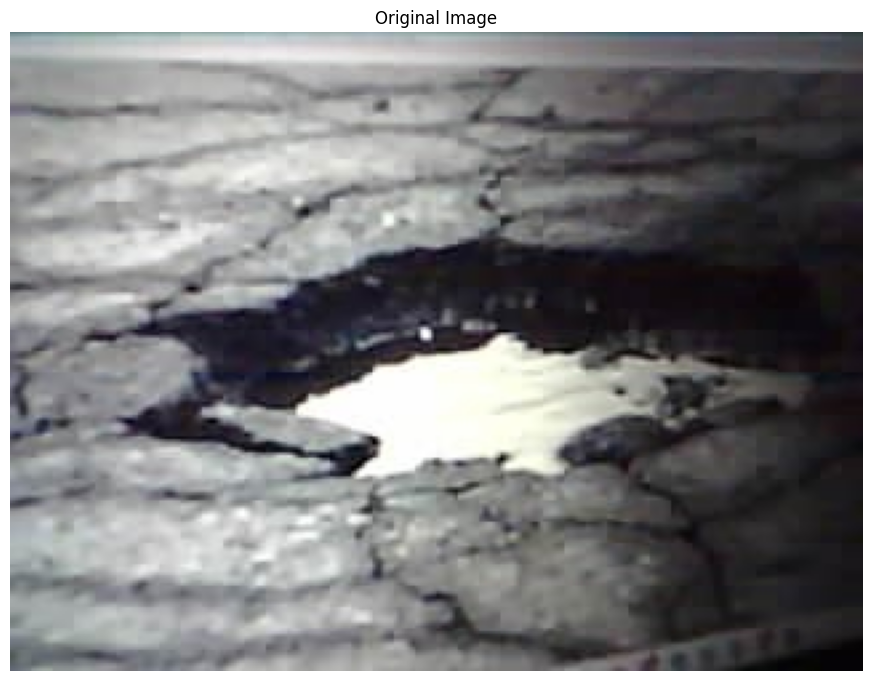

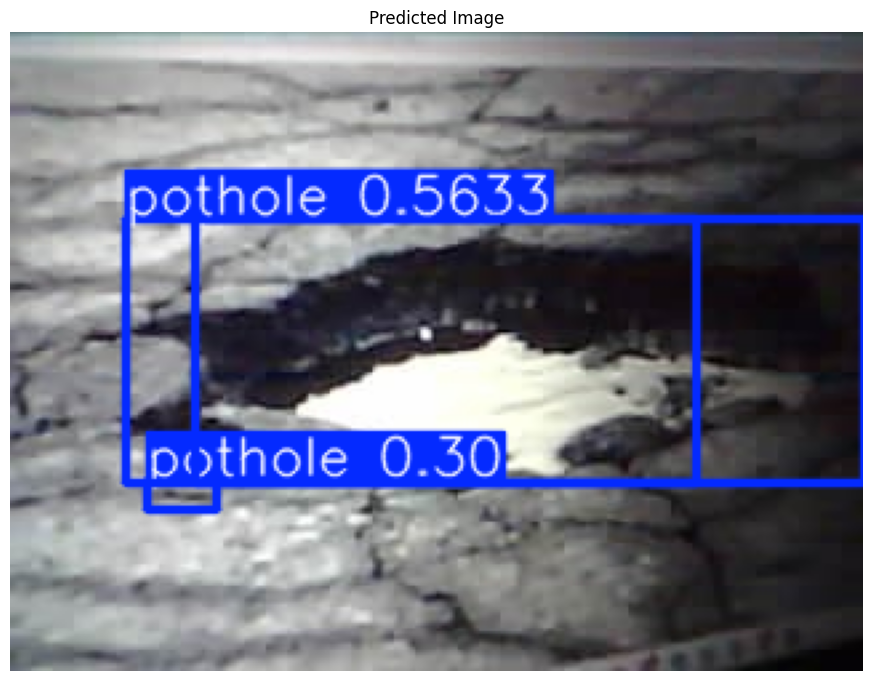

In [ ]:
import cv2
import matplotlib.pyplot as plt
from PIL import Image

# Path to the trained weights
trained_weights = "/content/best.pt"

# Load the YOLO model
model = YOLO(trained_weights)

def test_visualization(image_path):
    output = model.predict(image_path)

    # Load the original image
    im_bgr = cv2.imread(image_path)
    im_rgb = im_bgr[..., ::-1]  # Convert BGR to RGB

    # Plot the original image
    fig, ax = plt.subplots(figsize=(11, 11))
    ax.axis('off')
    ax.set_title("Original Image")
    ax.imshow(im_rgb)
    plt.show()

    # Plot the prediction result
    fig, ax = plt.subplots(figsize=(11, 11))
    ax.axis('off')
    ax.set_title("Predicted Image")
    im_bgr_pred = output[0].plot()  # BGR-order numpy array
    im_rgb_pred = im_bgr_pred[..., ::-1]  # Convert BGR to RGB
    ax.imshow(im_rgb_pred)
    plt.show()

# Path to the image on which you want to make predictions
image_path = "/content/20240715154844.jpg"

# Visualize the prediction on the single image
test_visualization(image_path)



image 1/1 /content/20240715165559.jpg: 384x512 1 pothole, 1127.1ms
Speed: 1.8ms preprocess, 1127.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 512)


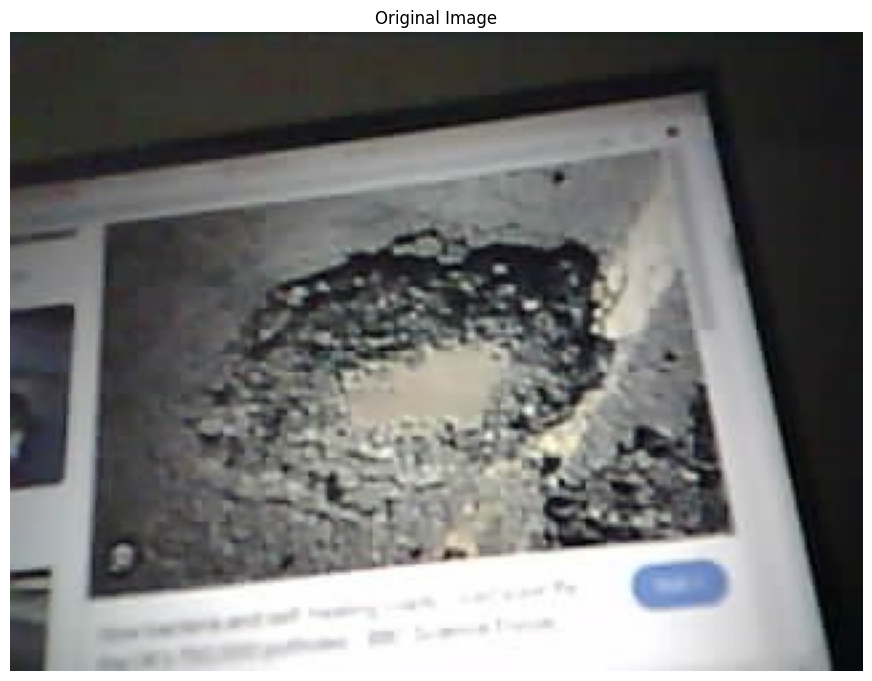

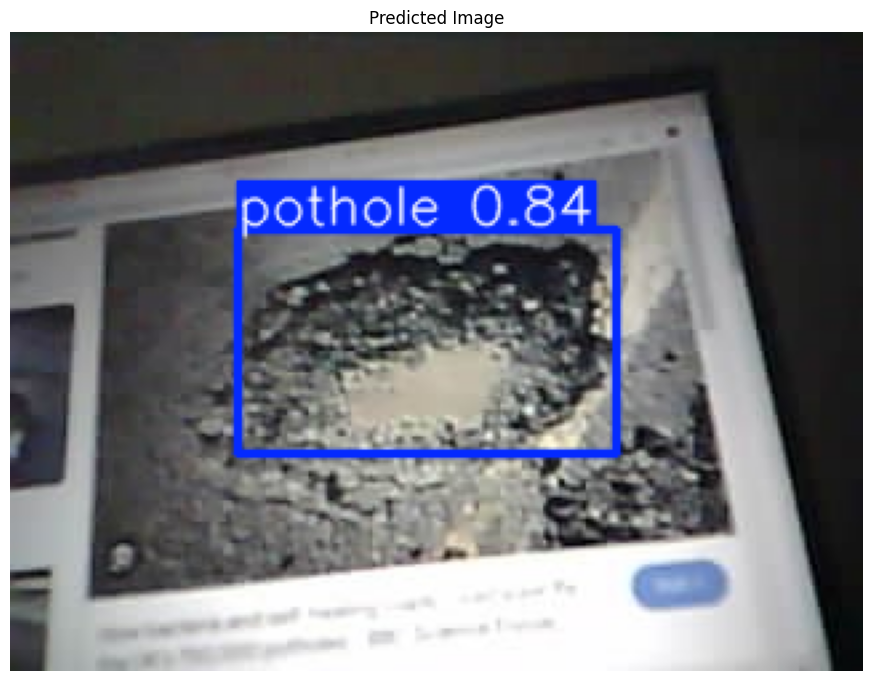

In [ ]:
import cv2
import matplotlib.pyplot as plt
from PIL import Image

# Path to the trained weights
trained_weights = "/content/best.pt"

# Load the YOLO model
model = YOLO(trained_weights)

def test_visualization(image_path):
    output = model.predict(image_path)

    # Load the original image
    im_bgr = cv2.imread(image_path)
    im_rgb = im_bgr[..., ::-1]  # Convert BGR to RGB

    # Plot the original image
    fig, ax = plt.subplots(figsize=(11, 11))
    ax.axis('off')
    ax.set_title("Original Image")
    ax.imshow(im_rgb)
    plt.show()

    # Plot the prediction result
    fig, ax = plt.subplots(figsize=(11, 11))
    ax.axis('off')
    ax.set_title("Predicted Image")
    im_bgr_pred = output[0].plot()  # BGR-order numpy array
    im_rgb_pred = im_bgr_pred[..., ::-1]  # Convert BGR to RGB
    ax.imshow(im_rgb_pred)
    plt.show()

# Path to the image on which you want to make predictions
image_path = "/content/20240715165559.jpg"

# Visualize the prediction on the single image
test_visualization(image_path)



image 1/1 /content/20240716114747.jpg: 384x512 4 potholes, 1107.4ms
Speed: 1.9ms preprocess, 1107.4ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 512)


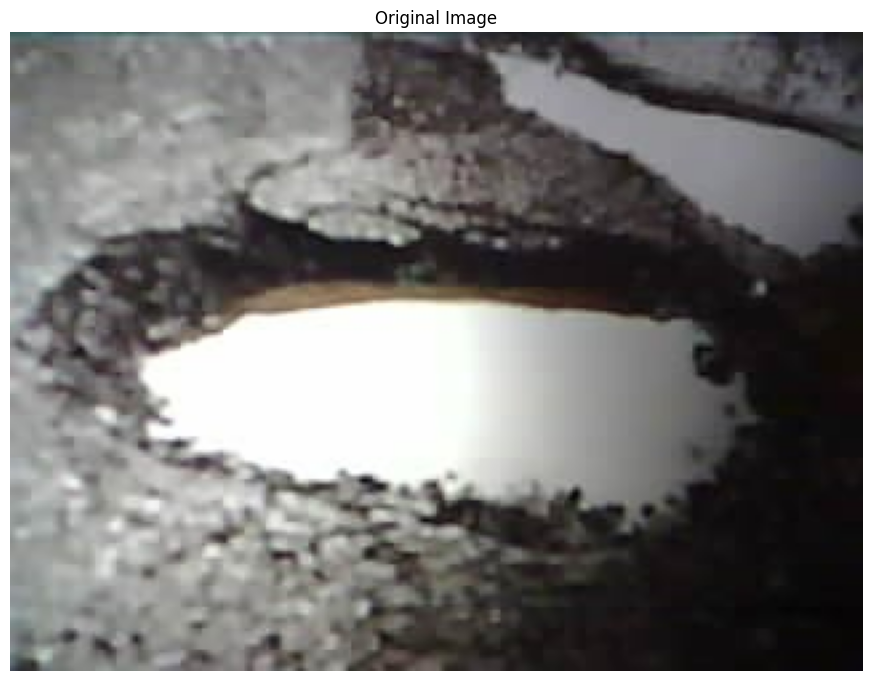

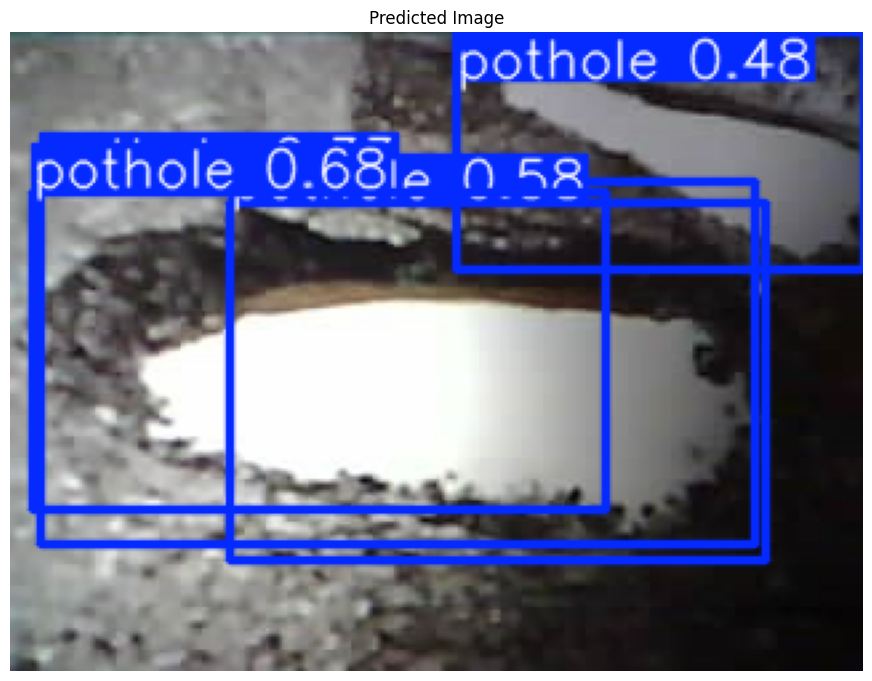

In [ ]:
import cv2
import matplotlib.pyplot as plt
from PIL import Image

# Path to the trained weights
trained_weights = "/content/best.pt"

# Load the YOLO model
model = YOLO(trained_weights)

def test_visualization(image_path):
    output = model.predict(image_path)

    # Load the original image
    im_bgr = cv2.imread(image_path)
    im_rgb = im_bgr[..., ::-1]  # Convert BGR to RGB

    # Plot the original image
    fig, ax = plt.subplots(figsize=(11, 11))
    ax.axis('off')
    ax.set_title("Original Image")
    ax.imshow(im_rgb)
    plt.show()

    # Plot the prediction result
    fig, ax = plt.subplots(figsize=(11, 11))
    ax.axis('off')
    ax.set_title("Predicted Image")
    im_bgr_pred = output[0].plot()  # BGR-order numpy array
    im_rgb_pred = im_bgr_pred[..., ::-1]  # Convert BGR to RGB
    ax.imshow(im_rgb_pred)
    plt.show()

# Path to the image on which you want to make predictions
image_path = "/content/20240716114747.jpg"

# Visualize the prediction on the single image
test_visualization(image_path)
